In [1]:
%matplotlib inline

import matplotlib 
import numpy as np
import pandas as pd
import os, sys, time, pickle, copy
#import ipywidgets
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
from mpl_toolkits.mplot3d.art3d import Poly3DCollection    

from scipy import optimize

import cv2 

matplotlib.rc('font', family='serif')
matplotlib.rc('font', size=10)
matplotlib.rc('legend', fontsize=16)
matplotlib.rc('legend', numpoints=1)
matplotlib.rc('legend', handlelength=1.5)
matplotlib.rc('legend', frameon=True)
matplotlib.rc('xtick.major', pad=7)
matplotlib.rc('xtick', direction="in")
matplotlib.rc('ytick', direction="in")
matplotlib.rc('xtick', top = True)
matplotlib.rc('ytick', right =True )
matplotlib.rc('xtick.minor', pad=7)
matplotlib.rc('text', usetex=True)

matplotlib.rc('figure', figsize=(12, 9))



# Chapter 7. 이미지 분할

# 이미지 분할 (Image segmentation)

#### 이미지 분할
이미지의 어떤 영역 $R$ 을 서로 겹치지 않으며 그 합집합이 영역 $R$ 이 되는 부분집합 $R_1,\ldots,\,R_n$ 으로 나누는 것. 즉, 
1. $R_i \ne \varnothing$ for all $i=1,\ldots,\,n$
2. $\displaystyle \bigcup_{i=1}^n = R$
3. 각각의 $R_i$ 는 연결된 집합.
4. $i \ne j \implies R_i \cap R_j = \varnothing$ 


<br>


# 이미지 이진화
## 오츠 방법으로 처리된 이진화 (Thresholding by Otsu’s algorithm)

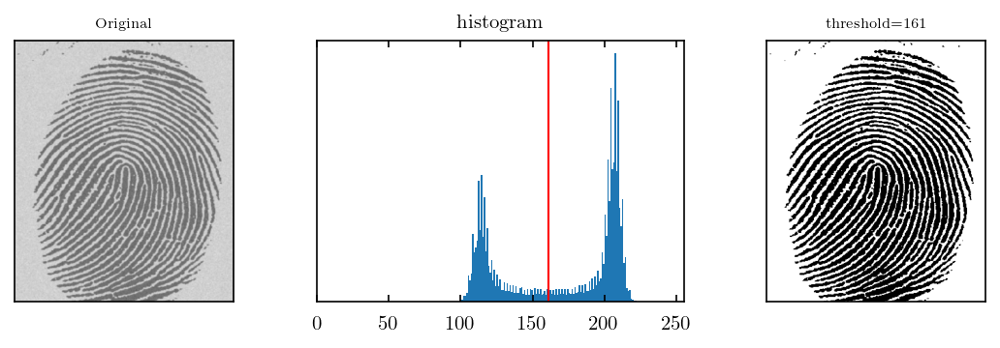

In [1885]:
# TThresholding by Otsu’s algorithm
img1=cv2.cvtColor(cv2.imread("./img_fingerprint_darkbg.png"), cv2.COLOR_BGR2GRAY)

fig1 = plt.figure(figsize=(8,2.5), dpi= 150, facecolor='w', edgecolor='k')
ax1, ax2, ax3=  fig1.add_subplot(131), fig1.add_subplot(132), fig1.add_subplot(133)

ax1.imshow(img1, cmap='gray', vmin=0, vmax=255)
ax1.set_title("Original", size=7)
ax1.get_xaxis().set_visible(False)
ax1.get_yaxis().set_visible(False)
hist = ax2.hist(img1.flatten(), bins=np.arange(0, 256, 1))


# Otsu algorithm
th, dst = cv2.threshold(img1, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)

ax2.axvline(th, color="r", linewidth=1)
ax2.set_xlim(0, 255)
ax2.set_title("histogram", size=10)
ax2.get_yaxis().set_visible(False)


ax3.imshow(dst, cmap='gray', vmin=0, vmax=255)
ax3.set_title("threshold=%3d"%th, size=7)

ax3.get_xaxis().set_visible(False)
ax3.get_yaxis().set_visible(False)

fig1.tight_layout()
plt.show()


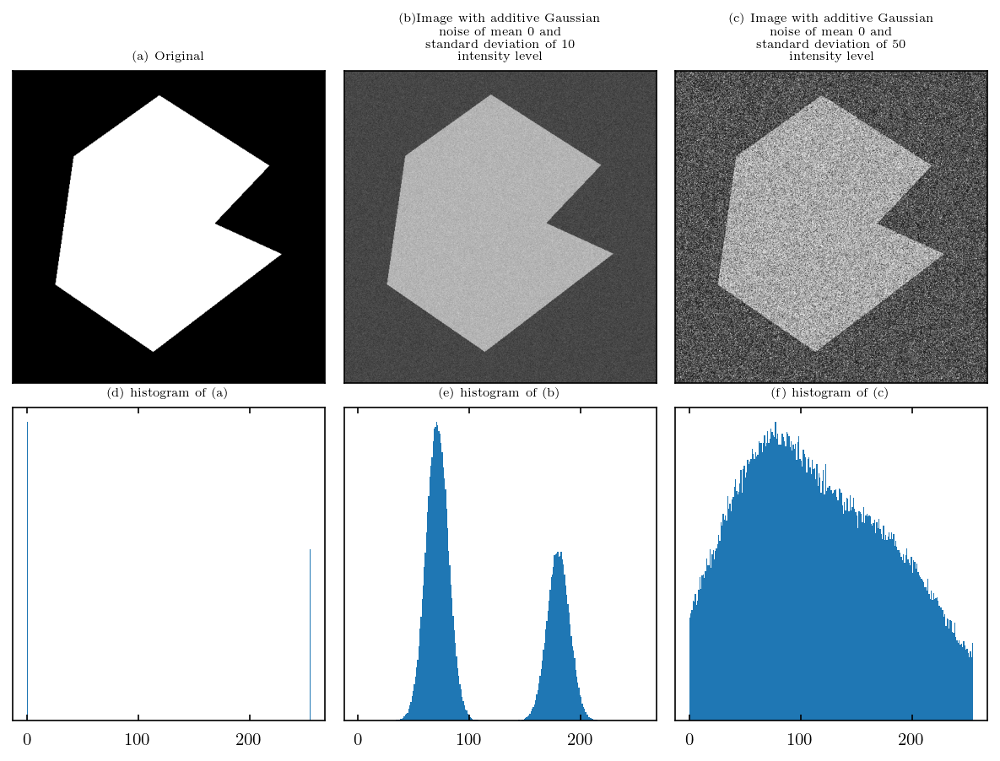

In [1886]:
# img_poly1, img_poly_2, img_poly3 는 다음에도 몇번 사용한다. 


contours = np.array([[240,40], [100,140], [70,350], [230,460], [440, 300], [330, 250], [420, 155]])
N=512
img_poly1 = np.zeros((N,N), np.uint8)
cv2.fillPoly(img_poly1, pts = [contours], color =(255,255,255))


n1= np.random.normal(71, 10, (N, N))
n2= np.random.normal(180, 10, (N, N))
img_poly2 = np.array(img_poly1, copy=True)
img_poly2 = img_poly2.astype(np.float32)

img_poly2[img_poly1<1] = n1[img_poly1<1]
img_poly2[img_poly1>200] = n2[img_poly1>200]
img_poly2[img_poly2>255]=255
img_poly2[img_poly2<0]=0
img_poly2 = img_poly2.astype(np.uint8)

n1= np.random.normal(71, 50, (N, N))
n2= np.random.normal(180, 50, (N, N))


# 표준편차가 50 인 정규분포를 취하면 그 값이 0보다 작거나 255보다 클 수 있으므로 아래와 같이 약간의 처리를 해 주었다.

img_poly3 = np.array(img_poly1, copy=True)
img_poly3 = img_poly3.astype(np.float32)
img_poly3[img_poly1<1] = n1[img_poly1<1]
img_poly3[img_poly1>200] = n2[img_poly1>200]

n3 = np.random.random((N,N))*256.

ids3 = (img_poly3<0) 
img_poly3[ids3]=n3[ids3]
ids4 = (img_poly3>255.0)
img_poly3[ids4] = n3[ids4]

img_poly3 = img_poly3.astype(np.int32)
img_poly3 = img_poly3.astype(np.uint8)



fig1 = plt.figure(figsize=(8,6), dpi= 150, facecolor='w', edgecolor='k')
ax1, ax2, ax3, ax4, ax5, ax6 =  fig1.add_subplot(231), fig1.add_subplot(232), fig1.add_subplot(233),\
                                fig1.add_subplot(234), fig1.add_subplot(235), fig1.add_subplot(236)


ax1.imshow(img_poly1, cmap='gray', vmin=0, vmax=255)
ax1.set_title("(a) Original", size=7)
ax1.get_xaxis().set_visible(False)
ax1.get_yaxis().set_visible(False)

hist = ax4.hist(img_poly1.flatten(), histtype='bar', bins=np.arange(0, 256, 1), rwidth=30)
ax4.get_yaxis().set_visible(False)
ax4.set_title("(d) histogram of (a)", size=7)

ax2.imshow(img_poly2, cmap='gray', vmin=0, vmax=255)
ax2.set_title("(b)Image with additive Gaussian\n noise of mean 0 and\n standard deviation of \
              10\n intensity level", size=7)
ax2.get_xaxis().set_visible(False)
ax2.get_yaxis().set_visible(False)



hist = ax5.hist(img_poly2.flatten(), histtype='bar', bins=np.arange(0, 256, 1), rwidth=30)
ax5.get_yaxis().set_visible(False)
ax5.set_title("(e) histogram of (b)", size=7)


# Otsu algorithm
# th, dst = cv2.threshold(img2, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)

ax3.imshow(img_poly3, cmap='gray', vmin=0, vmax=255)
ax3.set_title("(c) Image with additive Gaussian\n noise of mean 0 and\n standard deviation of \
              50\n intensity level", size=7)
ax3.get_xaxis().set_visible(False)
ax3.get_yaxis().set_visible(False)


hist = ax6.hist(img_poly3.flatten(), histtype='bar', bins=np.arange(0, 256, 1), rwidth=30)
ax6.get_yaxis().set_visible(False)
ax6.set_title("(f) histogram of (c)", size=7)

fig1.tight_layout()
plt.show()

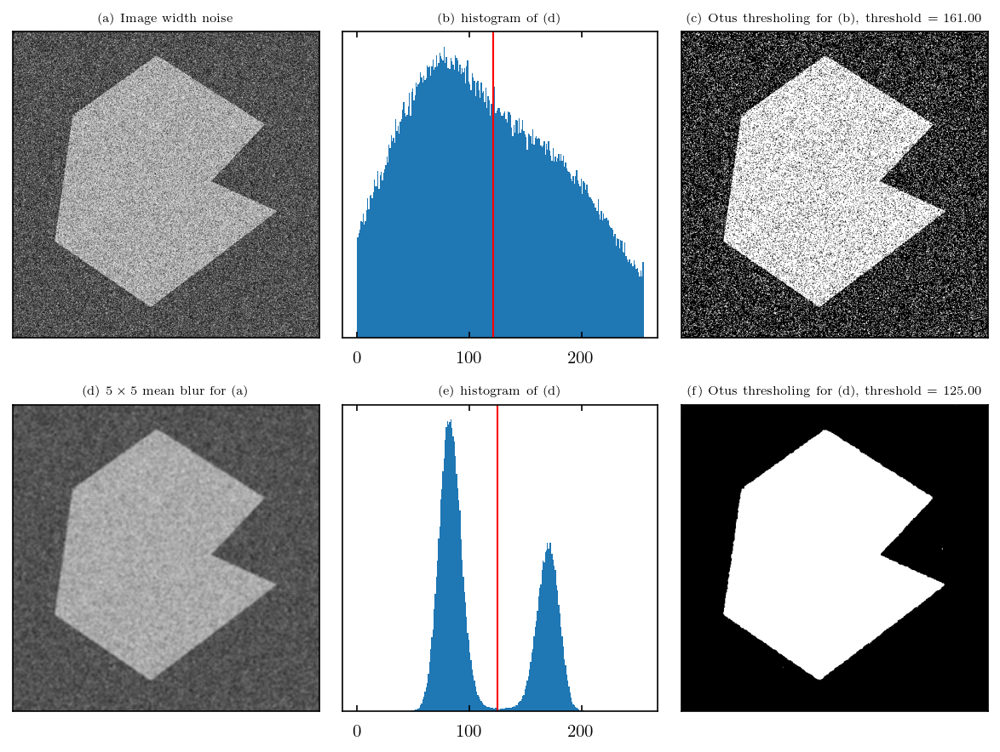

In [1887]:
# 위에서 작성한 img_poly2, img_poly_3  이미지에 오츠 알고리즘 사용.

fig1 = plt.figure(figsize=(8,6), dpi= 150, facecolor='w', edgecolor='k')
ax1, ax2, ax3, ax4, ax5, ax6 =  fig1.add_subplot(231), fig1.add_subplot(232), fig1.add_subplot(233),\
                                fig1.add_subplot(234), fig1.add_subplot(235), fig1.add_subplot(236)



ax1.imshow(img_poly3, cmap='gray', vmin=0, vmax=255)
ax1.set_title("(a) Image width noise ", size=7)
ax1.get_xaxis().set_visible(False)
ax1.get_yaxis().set_visible(False)

hist = ax2.hist(img_poly3.flatten(), histtype='bar', bins=np.arange(0, 256, 1), rwidth=30)
ax2.get_yaxis().set_visible(False)
ax2.set_title("(b) histogram of (d)", size=7)

# Otsu algorithm
th3, dst3 = cv2.threshold(img_poly3, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)

ax2.axvline(th3, color="r", linewidth=1)

ax3.imshow(dst3, cmap='gray', vmin=0, vmax=255)
ax3.set_title("(c) Otus thresholing for (b), threshold = %4.2f"%(th), size=7)
ax3.get_xaxis().set_visible(False)
ax3.get_yaxis().set_visible(False)


# mean bluring of img_poly3
img4 = cv2.blur(img_poly3, (5,5))


ax4.imshow(img4, cmap='gray', vmin=0, vmax=255)
ax4.set_title("(d) $5 \\times 5$ mean blur for (a) ", size=7)
ax4.get_xaxis().set_visible(False)
ax4.get_yaxis().set_visible(False)

hist = ax5.hist(img4.flatten(), histtype='bar', bins=np.arange(0, 256, 1), rwidth=30)
ax5.get_yaxis().set_visible(False)
ax5.set_title("(e) histogram of (d)", size=7)

# Otsu algorithm
th, dst = cv2.threshold(img4, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)

ax5.axvline(th, color="r", linewidth=1)

ax6.imshow(dst, cmap='gray', vmin=0, vmax=255)
ax6.set_title("(f) Otus thresholing for (d), threshold = %4.2f"%(th), size=7)
ax6.get_xaxis().set_visible(False)
ax6.get_yaxis().set_visible(False)

fig1.tight_layout()
plt.show()

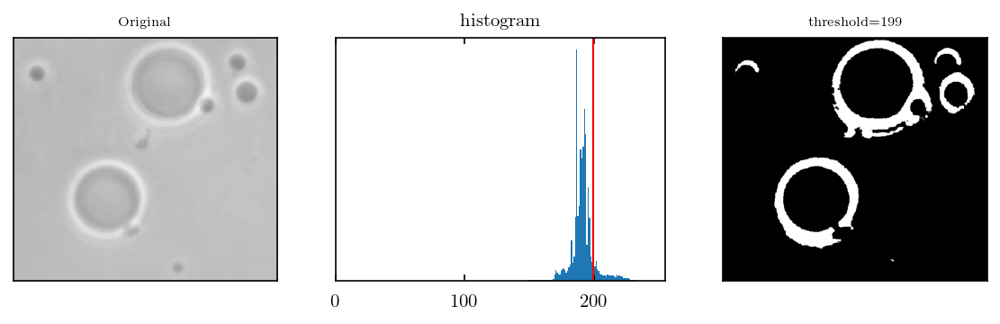

In [1888]:
img1=cv2.cvtColor(cv2.imread("./img_threshold_01.jpg"), cv2.COLOR_BGR2GRAY)

fig1 = plt.figure(figsize=(8,2.5), dpi= 150, facecolor='w', edgecolor='k')
ax1, ax2, ax3=  fig1.add_subplot(131), fig1.add_subplot(132), fig1.add_subplot(133)


ax1.imshow(img1, cmap='gray', vmin=0, vmax=255)
ax1.set_title("Original", size=7)
ax1.get_xaxis().set_visible(False)
ax1.get_yaxis().set_visible(False)
hist = ax2.hist(img1.flatten(), bins=np.arange(0, 256, 1))

# Otsu algorithm
th, dst = cv2.threshold(img1, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)

ax2.axvline(th, color="r", linewidth=1)
ax2.get_yaxis().set_visible(False)
ax2.set_xlim(0, 255)
ax3.imshow(dst, cmap='gray', vmin=0, vmax=255)
ax2.set_title("histogram", size=10)
ax3.set_title("threshold=%3d"%th, size=7)

ax3.get_xaxis().set_visible(False)
ax3.get_yaxis().set_visible(False)

fig1.tight_layout()
plt.show()

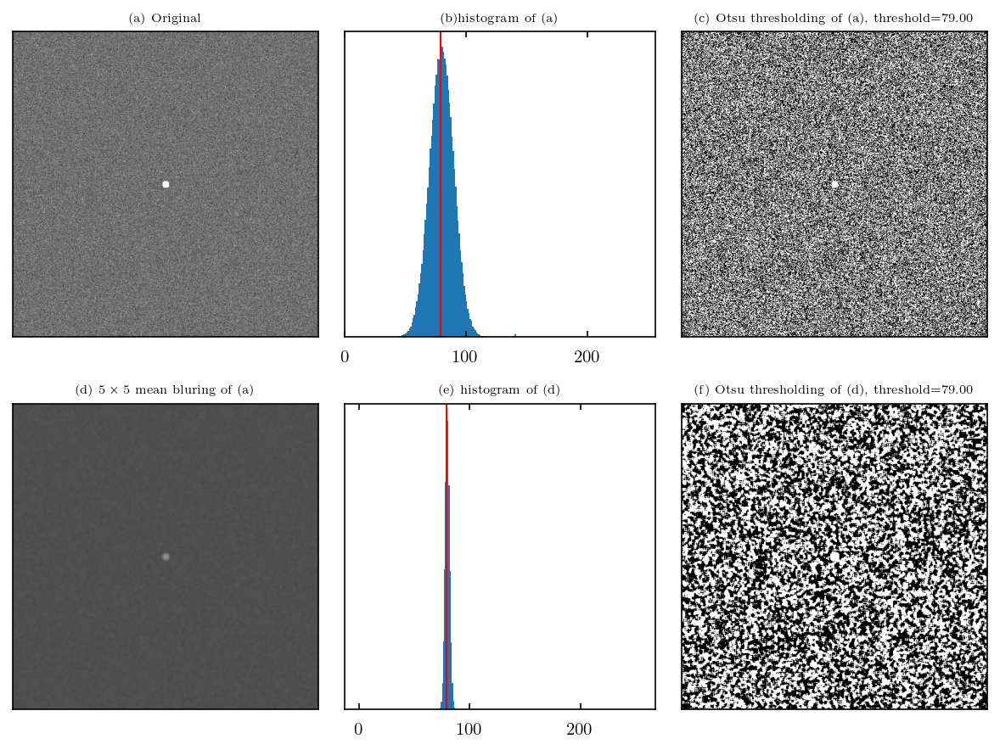

In [1889]:
N=512
img1=np.random.normal(80, 10, (N, N))
X, Y = np.meshgrid(np.arange(N), np.arange(N))
img1[(X-N/2)**2+(Y-N/2)**2<6**2]=140
img1[img1<0]=0
img1[img1>255]=255
img1=img1.astype(np.uint8)



fig1 = plt.figure(figsize=(8,6), dpi= 150, facecolor='w', edgecolor='k')
ax1, ax2, ax3, ax4, ax5, ax6, =  fig1.add_subplot(231), fig1.add_subplot(232), fig1.add_subplot(233),\
                                fig1.add_subplot(234), fig1.add_subplot(235), fig1.add_subplot(236)


ax1.imshow(img1, cmap='gray')#, vmin=0, vmax=256)
ax1.set_title("(a) Original", size=7)
ax1.get_xaxis().set_visible(False)
ax1.get_yaxis().set_visible(False)


hist = ax2.hist(img1.flatten(), bins=np.arange(0, 256, 1))

# Otsu algorithm
th, dst = cv2.threshold(img1 ,0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)

ax2.axvline(th, color="r", linewidth=1)
ax2.get_yaxis().set_visible(False)
ax2.set_xlim(0, 256)
ax2.set_title("(b)histogram of (a)", size=7)

ax3.imshow(dst, cmap='gray', vmin=0, vmax=255)
ax3.set_title("(c) Otsu thresholding of (a), threshold=%4.2f"%(th), size=7)
ax3.get_xaxis().set_visible(False)
ax3.get_yaxis().set_visible(False)

img4 = cv2.blur(img1, (5,5))
ax4.imshow(img4, cmap='gray', vmin=0, vmax=255)
ax4.set_title("(d) $5 \\times 5$ mean bluring of (a) ", size=7)
ax4.get_xaxis().set_visible(False)
ax4.get_yaxis().set_visible(False)

hist2 = ax5.hist(img4.flatten(), bins=np.arange(0, 256, 1))

# Otsu algorithm
th2, dst2 = cv2.threshold(img4, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)

ax5.axvline(th2, color="r", linewidth=1)
ax5.get_yaxis().set_visible(False)
ax5.set_title("(e) histogram of (d)", size=7)


ax6.imshow(dst2, cmap='gray')#, vmin=0, vmax=255)
ax6.set_title("(f) Otsu thresholding of (d), threshold=%4.2f"%(th2), size=7)

ax6.get_xaxis().set_visible(False)
ax6.get_yaxis().set_visible(False)


fig1.tight_layout()
plt.show()

158.40454538932903
0.0 1.0
255


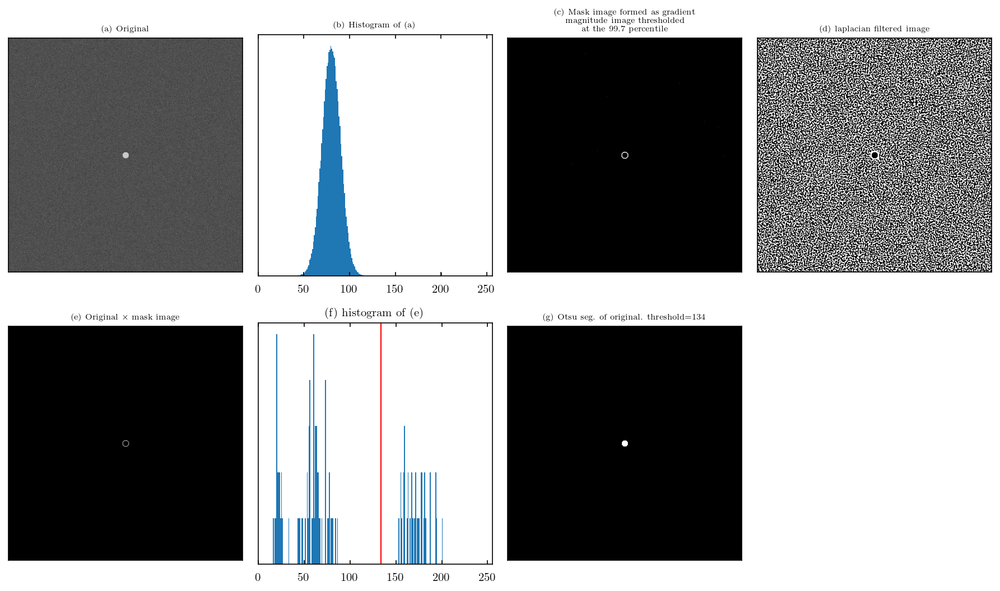

In [1890]:
fig1 = plt.figure(figsize=(12,7), dpi= 150, facecolor='w', edgecolor='k')
ax1, ax2, ax3, ax4, ax5, ax6, ax7=  fig1.add_subplot(241), fig1.add_subplot(242), fig1.add_subplot(243),\
                                fig1.add_subplot(244), fig1.add_subplot(245), fig1.add_subplot(246),\
                                fig1.add_subplot(247),

N=512
R=7
img1=np.random.normal(80, 10, (N, N))
X, Y = np.meshgrid(np.arange(N), np.arange(N))
img1[(X-N/2)**2+(Y-N/2)**2<R**2]=200
img1[img1<0]=0
img1[img1>255]=200
img1=img1.astype(np.uint8)


ax1.imshow(img1, cmap='gray', vmin=0, vmax=256)
ax1.set_title("(a) Original", size=7)
ax1.get_xaxis().set_visible(False)
ax1.get_yaxis().set_visible(False)


hist = ax2.hist(img1.flatten(), bins=np.arange(0, 256, 1))


ax2.get_yaxis().set_visible(False)
ax2.set_xlim(0, 256)
ax2.set_title("(b) Histogram of (a)", size=7)

laplacian = cv2.Laplacian(img1,cv2.CV_8U , ksize=7)
#ax3.imshow(laplacian, cmap='gray')#, vmin=0, vmax=255)

sobelx = cv2.Sobel(img1,cv2.CV_64F,1,0) # Find x and y gradients
sobely = cv2.Sobel(img1,cv2.CV_64F,0,1)

# Find magnitude and angle
magnitude = np.sqrt(sobelx**2.0 + sobely**2.0)
angle = np.arctan2(sobely, sobelx) * (180 / np.pi)

mgs = np.array(magnitude, copy=True).flatten()
mgs.sort()
th_mg = mgs[int(mgs.size * 0.9996)]
print(th_mg)

magnitude[magnitude<th_mg]=0

magnitude=magnitude/magnitude.max()

print(magnitude.min(), magnitude.max())
ax3.imshow(magnitude, cmap='gray')


ax3.set_title("(c) Mask image formed as gradient\n magnitude image thresholded\n at the 99.7 percentile", size=7)
ax3.get_xaxis().set_visible(False)
ax3.get_yaxis().set_visible(False)



laplacian_mask = np.abs(img1.astype(np.int64)-laplacian.astype(np.int64)).astype(np.uint8)
# lap0 = np.array(laplacian_mask, copy=True).flatten()
# lap0.sort()
#th_mask = lap0[int(lap0.max()*0.997)]

lap0 = np.array(laplacian, copy=True).flatten()
lap0.sort()
th_mask = lap0[int(lap0.size*0.9)]
print(th_mask)
th, laplacianf = cv2.threshold(laplacian, 254, 255, cv2.THRESH_BINARY)

ax4.imshow(laplacianf, cmap='gray', vmin=0, vmax=255)
ax4.set_title("(d) laplacian filtered image", size=7)
ax4.get_xaxis().set_visible(False)
ax4.get_yaxis().set_visible(False)

img4 = img1 * magnitude

ax5.imshow(img4, cmap='gray', vmin=0, vmax=255)
ax5.set_title("(e) Original $\\times$ mask image ", size=7)
ax5.get_xaxis().set_visible(False)
ax5.get_yaxis().set_visible(False)

hist = ax6.hist(img4.flatten(), bins=np.arange(1, 256, 1))

# Otsu algorithm
#th2, dst2 = cv2.threshold(img4, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)

th2 = 134

ax6.axvline(th2, color="r", linewidth=1)
ax6.get_yaxis().set_visible(False)
ax6.set_xlim(0, 255)
#ax7.set_ylim(-20, 4000)
ax6.set_title("(f) histogram of (e)", size=10)

imgf = np.array(img1, copy=True)
imgf[imgf<th2]=0
imgf[imgf>=th2]=255

ax7.imshow(imgf, cmap='gray', vmin=0, vmax=255)
ax7.set_title("(g) Otsu seg. of original. threshold=%3d"%th2, size=7)

ax7.get_xaxis().set_visible(False)
ax7.get_yaxis().set_visible(False)

fig1.tight_layout()

plt.show()


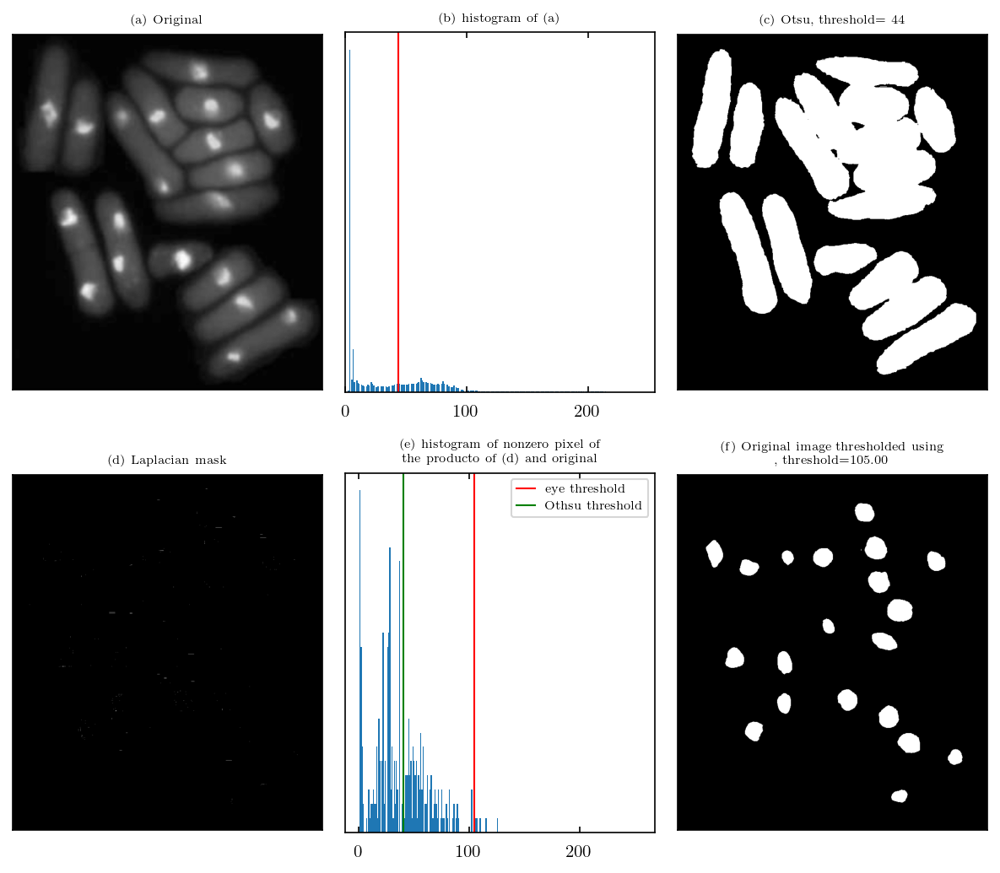

In [1891]:
img10=cv2.cvtColor(cv2.imread("./img_yeast_01.jpg"), cv2.COLOR_BGR2GRAY)
m1, M1 = img10.min(), img10.max()
img1 = ((img10-m1+1)*255./(M1-m1+1)).astype(np.uint8)

fig1 = plt.figure(figsize=(8,7), dpi= 150, facecolor='w', edgecolor='k')
ax1, ax2, ax3=  fig1.add_subplot(231), fig1.add_subplot(232), fig1.add_subplot(233)
ax4, ax5, ax6=  fig1.add_subplot(234), fig1.add_subplot(235), fig1.add_subplot(236)

ax1.imshow(img1, cmap='gray', vmin=0, vmax=255)
ax1.set_title("(a) Original", size=7)
ax1.get_xaxis().set_visible(False)
ax1.get_yaxis().set_visible(False)
hist = ax2.hist(img1.flatten(), bins=np.arange(0, 256, 1))


# Otsu algorithm
th, dst = cv2.threshold(img1, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)

ax2.axvline(th, color="r", linewidth=1)
ax2.set_xbound(0, 255)
#ax2.set_yscale('log')
ax2.set_title("(b) histogram of (a)", size=7)
ax2.get_yaxis().set_visible(False)


ax3.imshow(dst, cmap='gray', vmin=0, vmax=255)
ax3.set_title("(c) Otsu, threshold=%3d"%th, size=7)

ax3.get_xaxis().set_visible(False)
ax3.get_yaxis().set_visible(False)

thl=25
laplacian = cv2.Laplacian(img1,cv2.CV_8U , ksize=3)
laplacian[laplacian<thl]=0
# laplacian[laplacian>=thl]=1
laplacian = laplacian/laplacian.max()

# lap_mask = img1-laplacian
# lap_mask[lap_mask<100]=0
ax4.imshow(laplacian*255, cmap='gray')#, vmin=0, vmax=255)
ax4.set_title("(d) Laplacian mask", size=7)
ax4.get_xaxis().set_visible(False)
ax4.get_yaxis().set_visible(False)



hist = ax5.hist((laplacian*img1).flatten(), bins=np.arange(1, 256, 1))
ax5.set_title("(e) histogram of nonzero pixel of\nthe producto of (d) and original", size=7)
ax5.get_yaxis().set_visible(False)

#ax6.imshow(laplacian*img1, cmap='gray')

# Otsu algorithm
# 여기서는 laplacian 과 img1 이미지의 곱값중 0 이 아닌 값에 대해서만 Othu threshold 값들 구한다. 
imgprod = (laplacian*img1).astype(np.uint8)
iig = imgprod[imgprod>0]
tho, dst2 = cv2.threshold(iig, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)

# 수동으로 threshold 값을 정해주었음. 

th2=105
ax5.axvline(th2, color="r", linewidth=1, label = "eye threshold")
ax5.axvline(tho, color="g", linewidth=1, label = "Othsu threshold")
ax5.legend(fontsize=7, loc=0)
imgf=np.array(img1, copy=True)
imgf[img1<th2]=0
imgf[img1>=th2]=255
ax6.imshow(imgf, cmap='gray')
ax6.set_title("(f) Original image thresholded using\n, threshold=%5.2f"%th2, size=7)
ax6.get_xaxis().set_visible(False)
ax6.get_yaxis().set_visible(False)

fig1.tight_layout()
plt.show()



### Python code for Otsu thresholding

- 2분할, 3분할 하기 위해 직접 코딩하였다.

In [1041]:
def otsu2(img, maxval=255):
    """
    Otsu binary segmentation
    
    parameters
    ----------
    img : image array
    maxval : threshold 이상의 값을 가지는 값을 return 하는 이미지에서 채우는 값.
    
    return
    ------
    th : threashold value
    dst : binary image
    """
    
    Npixel = img.size
    hist = np.bincount(img.flatten())/Npixel
    maxvar = 0
    mg = (hist*np.arange(hist.size)).sum()
    
    # find first nonzero histogram index. 
    indnonzero = np.nonzero(hist)[0]
    th0 = indnonzero[0]
    
    for th in indnonzero[:-1]:
        
        hist1, hist2 = hist[0:th+1], hist[th+1:]
        p1 = hist1.sum()
        p2 = 1.-p1
        if p1>0.99999:
            break
        m1 = (hist1*np.arange(hist1.size)).sum()/p1
        #print(mg, p1, m1)
        varb = p1/p2*(mg-m1)**2
        if varb > maxvar:
            maxvar = varb
            th0 = th
    dst = np.array(img, copy=True)
    dst[img<th0]=0
    dst[img >=th0]=maxval
    return th0, dst
        
def otsu3(img, val1=128, val2=255):
    """
    Otsu triple segmentation
    
    th1, th2 두 값으로 이미지를 3분할 한다. 
    
    parameters
    ----------
    img : image array
    
    val1 : th1 이상 th2 미만을 가지는 값을 return 하는 이미지에서 채우는 값.
    val2 : th2 이상을 가지는 값을 return 하는 이미지에서 채우는 값.
    
    return
    ------
    th1, th2 : threashold value
    dst : binary image
    """
    
    
    Npixel = img.size
    hist = np.bincount(img.flatten())/Npixel

    maxvar = 0
    mg = (hist*np.arange(hist.size)).sum()
    # find first nonzero histogram index. 
    indnonzero = np.nonzero(hist)[0]
    th1 = indnonzero[0]
    th2 = indnonzero[1]
    stopflag = False

    for indx, thx in enumerate(indnonzero[0:-2]):
        
        for thy in indnonzero[indx+1:-1]:
            hist1, hist2, hist3 = hist[0:thx+1], hist[thx+1:thy+1], hist[thy+1:]
            p1 = hist1.sum()
            p2 = hist2.sum()
            p3 = 1.-p1-p2
            
            m1 = (hist1*np.arange(thx+1)).sum()/p1
            m2 = (hist2*np.arange(thx+1, thy+1)).sum()/p2
            m3 = (hist3*np.arange(thy+1, 256)).sum()/p3
            
            varb = p1*(m1-mg)**2+p2*(m2-mg)**2+p3*(m3-mg)**2
            if varb > maxvar:
                maxvar = varb
                th1 = thx
                th2 = thy
                
    dst = np.full(img.shape, val1)
    dst[img<th1]=0
    dst[img >=th2]=val2
    return th1, th2, dst

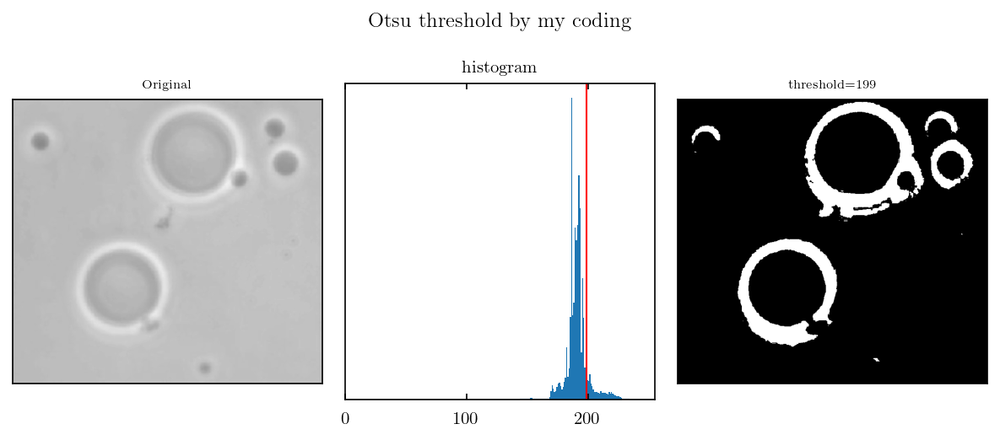

In [1892]:
img1=cv2.cvtColor(cv2.imread("./img_threshold_01.jpg"), cv2.COLOR_BGR2GRAY)
th1, dst = otsu(img1)
fig1 = plt.figure(figsize=(8,3.5), dpi= 150, facecolor='w', edgecolor='k')
ax1, ax2, ax3=  fig1.add_subplot(131), fig1.add_subplot(132), fig1.add_subplot(133)


ax1.imshow(img1, cmap='gray', vmin=0, vmax=255)
ax1.set_title("Original", size=7)
ax1.get_xaxis().set_visible(False)
ax1.get_yaxis().set_visible(False)
hist = ax2.hist(img1.flatten(), bins=np.arange(0, 256, 1))

# Otsu algorithm
th, dst = otsu2(img1, 255)#, cv2.THRESH_BINARY | cv2.THRESH_OTSU)

ax2.axvline(th1, color="r", linewidth=1)
ax2.get_yaxis().set_visible(False)
ax2.set_xlim(0, 255)
ax3.imshow(dst, cmap='gray', vmin=0, vmax=255)
ax2.set_title("histogram", size=10)
ax3.set_title("threshold=%3d"%th, size=7)

ax3.get_xaxis().set_visible(False)
ax3.get_yaxis().set_visible(False)

fig1.suptitle("Otsu threshold by my coding")

fig1.tight_layout()
plt.show()

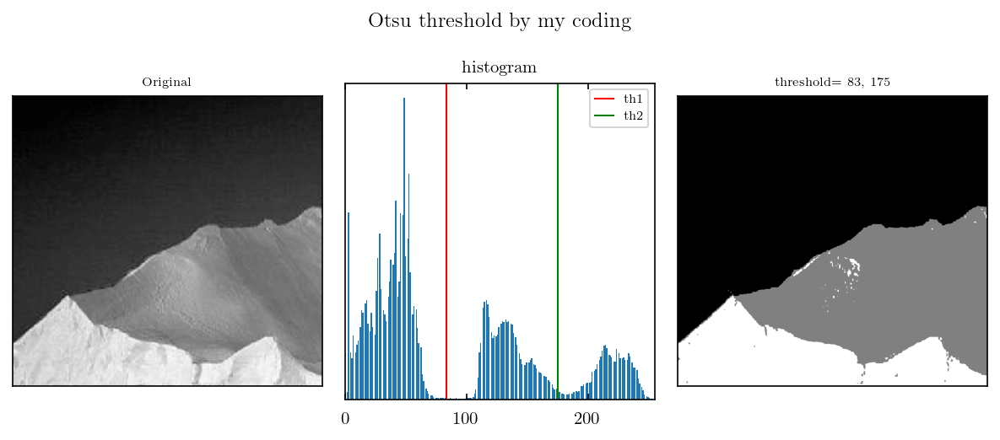

In [1893]:
img0=cv2.cvtColor(cv2.imread("./img_tripleseg_01.jpg"), cv2.COLOR_BGR2GRAY)
img1 = (img0-img0.min())*255./(img0.max()-img0.min())
img1 = img1.astype(np.uint8)

th1, th2, dst = otsu3(img1)

fig1 = plt.figure(figsize=(8,3.5), dpi= 150, facecolor='w', edgecolor='k')
ax1, ax2, ax3=  fig1.add_subplot(131), fig1.add_subplot(132), fig1.add_subplot(133)


ax1.imshow(img1, cmap='gray', vmin=0, vmax=255)
ax1.set_title("Original", size=7)
ax1.get_xaxis().set_visible(False)
ax1.get_yaxis().set_visible(False)
hist = ax2.hist(img1.flatten(), bins=np.arange(0, 256, 1))


ax2.axvline(th1, color="r", linewidth=1, label="th1")
ax2.axvline(th2, color="g", linewidth=1, label="th2")
ax2.get_yaxis().set_visible(False)
ax2.set_xlim(0, 255)
ax2.legend(fontsize=7)
ax2.set_title("histogram", size=10)


ax3.imshow(dst, cmap='gray', vmin=0, vmax=255)
ax3.set_title("threshold=%3d, %3d"%(th1, th2), size=7)
ax3.get_xaxis().set_visible(False)
ax3.get_yaxis().set_visible(False)

fig1.suptitle("Otsu threshold by my coding")

fig1.tight_layout()
plt.show()

## 적응형 이진화 (Local or Adaptive Thresholding)

### Image segmentation using sub-Windows (partitioning)

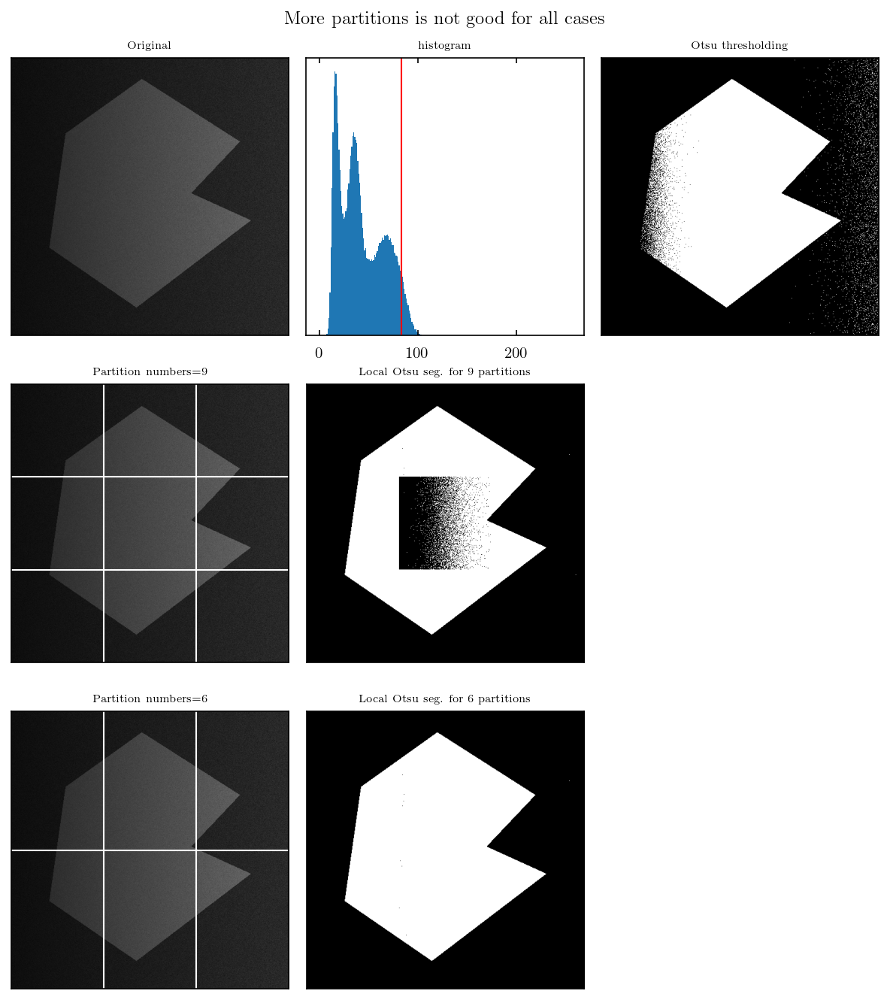

In [1894]:
contours = np.array([[240,40], [100,140], [70,350], [230,460], [440, 300], [330, 250], [420, 155]])
N=512
img_poly1 = np.zeros((N,N), np.uint8)
cv2.fillPoly(img_poly1, pts = [contours], color =(255,255,255))


n1= np.random.normal(71, 10, (N, N))
n2= np.random.normal(180, 10, (N, N))
img_poly2 = np.array(img_poly1, copy=True)
img_poly2 = img_poly2.astype(np.float32)

img_poly2[img_poly1<1] = n1[img_poly1<1]
img_poly2[img_poly1>200] = n2[img_poly1>200]
img_poly2[img_poly2>255]=255
img_poly2[img_poly2<0]=0
img_poly2 = img_poly2.astype(np.uint8)


fig1 = plt.figure(figsize=(8,9), dpi= 150, facecolor='w', edgecolor='k')
ax1, ax2, ax3=  fig1.add_subplot(331), fig1.add_subplot(332), fig1.add_subplot(333)
ax4, ax5 =  fig1.add_subplot(334), fig1.add_subplot(335),
ax6, ax7 = fig1.add_subplot(337), fig1.add_subplot(338)
X, Y = np.meshgrid(np.arange(N), np.arange(N))

imgp = (X/N*0.4)+0.2

img1=(img_poly2*imgp).astype(np.uint8)
ax1.imshow(img1, cmap='gray', vmin=0, vmax=255)
ax1.set_title("Original", size=7)
ax1.get_xaxis().set_visible(False)
ax1.get_yaxis().set_visible(False)

ax2.hist(img1.flatten(), bins = np.arange(-0.5, 255.6, 1.))
ax2.get_yaxis().set_visible(False)
ax2.set_title("histogram", size=7)


th, dst = cv2.threshold(img1, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
ax3.imshow(dst, cmap='gray')
ax3.get_xaxis().set_visible(False)
ax3.get_yaxis().set_visible(False)
ax2.axvline(th1, color="r", linewidth=1)#, label="th1")
ax3.set_title("Otsu thresholding", size=7)

ax4.imshow(img1, cmap='gray', vmin=0, vmax=255)
ax4.set_title("Partition numbers=9", size=7)
ax4.get_xaxis().set_visible(False)
ax4.get_yaxis().set_visible(False)


N1, N2, M1 =int(N/3), int(N/3*2), int(N/2)

ax4.axvline(N1, color="w", linewidth=1)
ax4.axvline(N2, color="w", linewidth=1)
ax4.axhline(N1, color="w", linewidth=1)
ax4.axhline(N2, color="w", linewidth=1)


img00 = img1[0:N1, 0:N1]
img01 = img1[0:N1, N1:N2]
img02 = img1[0:N1, N2:]
img10 = img1[N1:N2, 0:N1]
img11 = img1[N1:N2, N1:N2]
img12 = img1[N1:N2, N2:]
img20 = img1[N2:, 0:N1]
img21 = img1[N2:, N1:N2]
img22 = img1[N2:, N2:]


th00, dist00 = cv2.threshold(img00, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
th01, dist01 = cv2.threshold(img01, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
th02, dist02 = cv2.threshold(img02, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
th10, dist10 = cv2.threshold(img10, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
th11, dist11 = cv2.threshold(img11, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
th12, dist12 = cv2.threshold(img12, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
th20, dist20 = cv2.threshold(img20, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
th21, dist21 = cv2.threshold(img21, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
th22, dist22 = cv2.threshold(img22, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)

imgf = np.zeros(img1.shape, np.uint8)
imgf[0:N1, 0:N1]=dist00
imgf[0:N1, N1:N2]=dist01
imgf[:N1, N2:]=dist02
imgf[N1:N2, 0:N1]=dist10
imgf[N1:N2, N1:N2]=dist11
imgf[N1:N2, N2:]=dist12
imgf[N2:, 0:N1]=dist20
imgf[N2:, N1:N2]=dist21
imgf[N2:, N2:]=dist22
ax5.imshow(imgf, cmap='gray')
ax5.set_title("Local Otsu seg. for 9 partitions", size=7)
ax5.get_xaxis().set_visible(False)
ax5.get_yaxis().set_visible(False)

img00 = img1[0:M1, 0:N1]
img01 = img1[0:M1, N1:N2]
img02 = img1[0:M1, N2:]
img10 = img1[M1:, 0:N1]
img11 = img1[M1:, N1:N2]
img12 = img1[M1:, N2:]

th00, dist00 = cv2.threshold(img00, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
th01, dist01 = cv2.threshold(img01, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
th02, dist02 = cv2.threshold(img02, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
th10, dist10 = cv2.threshold(img10, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
th11, dist11 = cv2.threshold(img11, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)
th12, dist12 = cv2.threshold(img12, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)

ax6.imshow(img1, cmap='gray', vmin=0, vmax=255)
ax6.set_title("Partition numbers=6", size=7)
ax6.get_xaxis().set_visible(False)
ax6.get_yaxis().set_visible(False)


ax6.axvline(N1, color="w", linewidth=1)
ax6.axvline(N2, color="w", linewidth=1)
ax6.axhline(M1, color="w", linewidth=1)


imgf = np.zeros(img1.shape, np.uint8)
imgf[0:M1, 0:N1]=dist00
imgf[0:M1, N1:N2]=dist01
imgf[:M1, N2:]=dist02
imgf[M1:, 0:N1]=dist10
imgf[M1:, N1:N2]=dist11
imgf[M1:, N2:]=dist12

ax7.imshow(imgf, cmap='gray')
ax7.get_xaxis().set_visible(False)
ax7.get_yaxis().set_visible(False)
ax7.set_title("Local Otsu seg. for 6 partitions", size=7)


fig1.suptitle("More partitions is not good for all cases")
fig1.tight_layout()
plt.show()

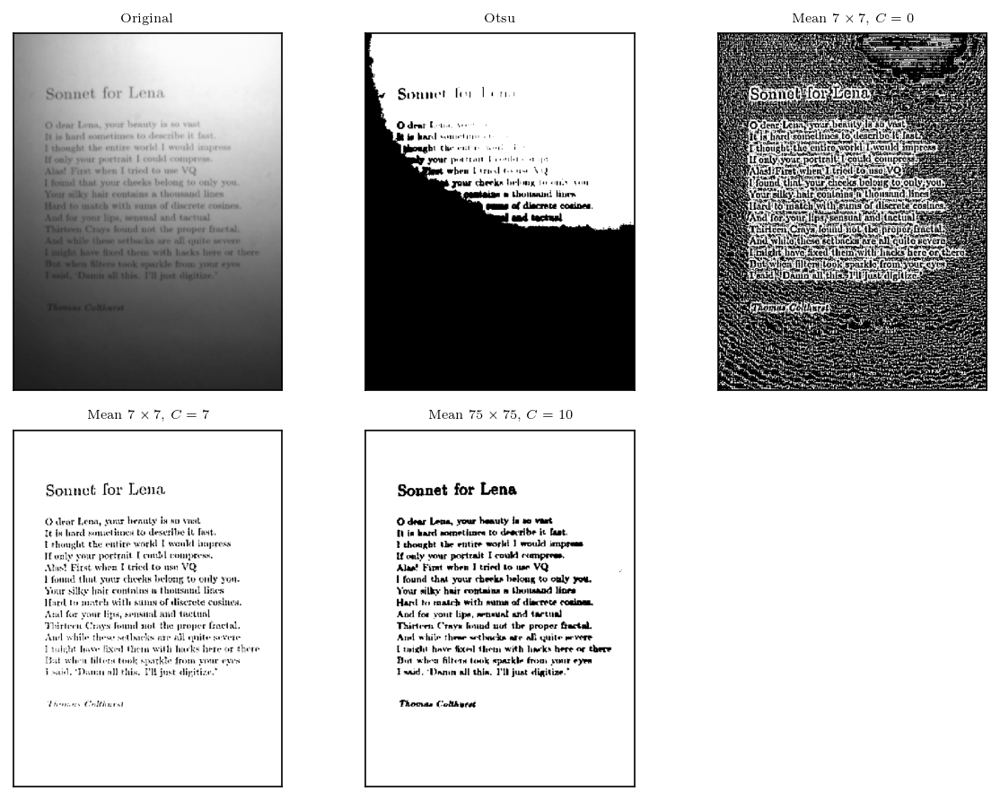

In [1895]:
img1=cv2.cvtColor(cv2.imread("./img_sonnet_01.png"), cv2.COLOR_BGR2GRAY)

fig1 = plt.figure(figsize=(8,9), dpi= 150, facecolor='w', edgecolor='k')
ax1, ax2, ax3=  fig1.add_subplot(331), fig1.add_subplot(332), fig1.add_subplot(333)
ax4, ax5 =  fig1.add_subplot(334), fig1.add_subplot(335)
#ax7, ax8 = fig1.add_subplot(337), fig1.add_subplot(338)


ax1.imshow(img1, cmap='gray', vmin=0, vmax=255)
ax1.set_title("Original", size=7)
ax1.get_xaxis().set_visible(False)
ax1.get_yaxis().set_visible(False)

th, img2=cv2.threshold(img1, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)

ax2.imshow(img2, cmap='gray', vmin=0, vmax=255)
ax2.set_title("Otsu", size=7)
ax2.get_xaxis().set_visible(False)
ax2.get_yaxis().set_visible(False)


img3 = cv2.adaptiveThreshold(img1, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 7, 0)
ax3.imshow(img3, cmap='gray', vmin=0, vmax=255)
ax3.set_title("Mean $7 \\times 7$, $C=0$", size=7)
ax3.get_xaxis().set_visible(False)
ax3.get_yaxis().set_visible(False)


img4 = cv2.adaptiveThreshold(img1, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 7, 7)
ax4.imshow(img4, cmap='gray', vmin=0, vmax=255)
ax4.set_title("Mean $7\\times 7$, $C=7$", size=7)
ax4.get_xaxis().set_visible(False)
ax4.get_yaxis().set_visible(False)

img5 = cv2.adaptiveThreshold(img1, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 75, 10)
ax5.imshow(img5, cmap='gray', vmin=0, vmax=255)
ax5.set_title("Mean $75 \\times 75$, $C=10$", size=7)
ax5.get_xaxis().set_visible(False)
ax5.get_yaxis().set_visible(False)

fig1.tight_layout()
plt.show()


In [1323]:
def malt(img, n, th, maxval=256):
    """
    Realization of moving average local threshold
    
    parameters
    ----------
    img : 256 scale gray image
    n : odd integer. number of pixels to be averaged. 
    th : threshold
    
    return
    ------
    dst : binary image
    """
    
    
    edge=(n-1)>>1
    img0 = img[0::2, :]
    img1 = img[1::2, :]
    imgr = np.empty(img.shape)
    imgr[0::2, :]=img0
    imgr[1::2, :]=img1[:, ::-1]
    imgk = imgr.flatten()
    imgf = np.zeros((imgk.size+n, n))
    
    for i in range(n):
        imgf[i:-(n-i), i]= imgk
    img2 = imgf.mean(axis=1)
    
    img3=(img2[edge:-edge-1]).reshape(img.shape)
    
    imgr[0::2, :]=img3[::2, :]
    imgr[1::2, :]=img3[1::2, ::-1]
    
    dst = ((img-imgr)>-th).astype(np.uint8)*maxval
    
    return dst

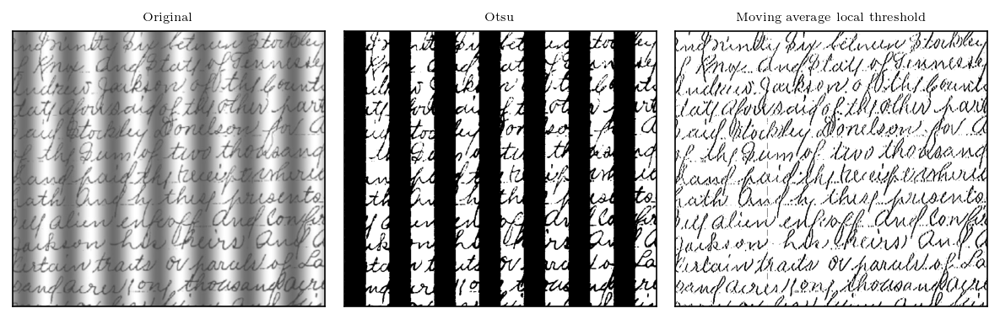

In [1896]:
img1=cv2.cvtColor(cv2.imread("./img_movingavg_01.jpg"), cv2.COLOR_BGR2GRAY)

fig1 = plt.figure(figsize=(8,5), dpi= 150, facecolor='w', edgecolor='k')
ax1, ax2, ax3=  fig1.add_subplot(131), fig1.add_subplot(132), fig1.add_subplot(133)


ax1.imshow(img1, cmap='gray', vmin=0, vmax=255)
ax1.set_title("Original", size=7)
ax1.get_xaxis().set_visible(False)
ax1.get_yaxis().set_visible(False)

th, img2=cv2.threshold(img1, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)

ax2.imshow(img2, cmap='gray', vmin=0, vmax=255)
ax2.set_title("Otsu", size=7)
ax2.get_xaxis().set_visible(False)
ax2.get_yaxis().set_visible(False)

img3 = malt(img1, 7, 4)
ax3.imshow(img3, cmap='gray', vmin=0, vmax=255)
ax3.set_title("Moving average local threshold", size=7)
ax3.get_xaxis().set_visible(False)
ax3.get_yaxis().set_visible(False)

fig1.tight_layout()
plt.show()

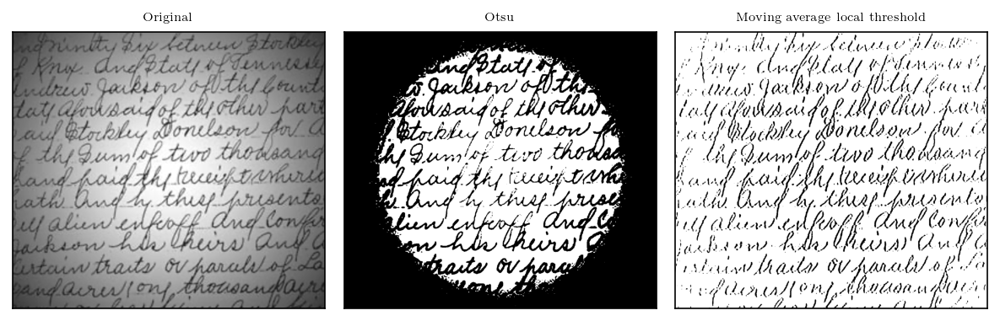

In [1897]:
img1=cv2.cvtColor(cv2.imread("./img_movingavg_02.jpg"), cv2.COLOR_BGR2GRAY)

fig1 = plt.figure(figsize=(8,5), dpi= 150, facecolor='w', edgecolor='k')
ax1, ax2, ax3=  fig1.add_subplot(131), fig1.add_subplot(132), fig1.add_subplot(133)


ax1.imshow(img1, cmap='gray', vmin=0, vmax=255)
ax1.set_title("Original", size=7)
ax1.get_xaxis().set_visible(False)
ax1.get_yaxis().set_visible(False)

th, img2=cv2.threshold(img1, 0, 255, cv2.THRESH_BINARY | cv2.THRESH_OTSU)

ax2.imshow(img2, cmap='gray', vmin=0, vmax=255)
ax2.set_title("Otsu", size=7)
ax2.get_xaxis().set_visible(False)
ax2.get_yaxis().set_visible(False)

img3 = malt(img1, 15, 11)
ax3.imshow(img3, cmap='gray', vmin=0, vmax=255)
ax3.set_title("Moving average local threshold", size=7)
ax3.get_xaxis().set_visible(False)
ax3.get_yaxis().set_visible(False)
fig1.tight_layout()
plt.show()

# 이미지 영역 찾기 (Region-based segmentation)

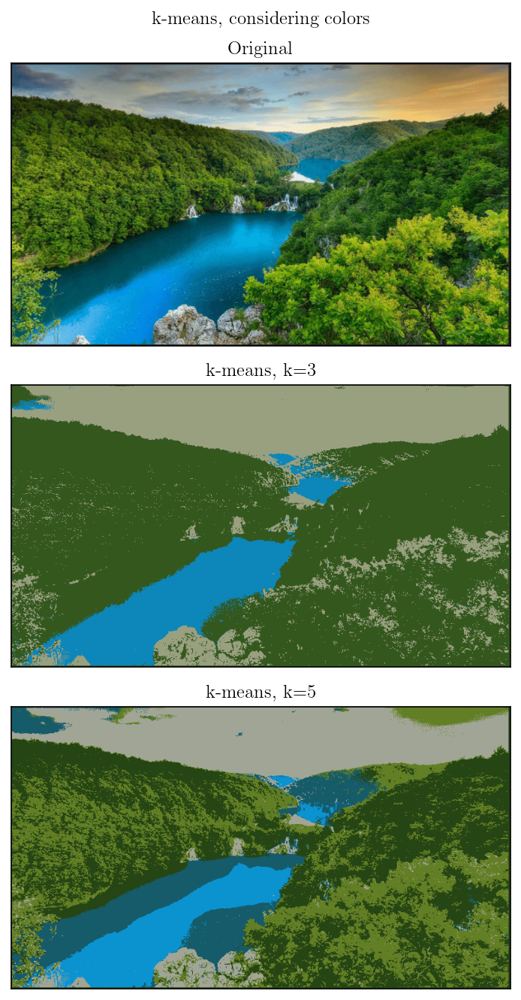

In [1898]:
img1=cv2.cvtColor(cv2.imread("./img_river.png", cv2.IMREAD_COLOR),cv2.COLOR_BGR2RGB)

fig1 = plt.figure(figsize=(8,9), dpi= 150, facecolor='w', edgecolor='k')
ax1, ax2, ax3=  fig1.add_subplot(311), fig1.add_subplot(312), fig1.add_subplot(313)


ax1.imshow(img1)#, cmap='gray', vmin=0, vmax=255)
ax1.set_title("Original")
ax1.get_xaxis().set_visible(False)
ax1.get_yaxis().set_visible(False)

# The below code for k-means comes from https://www.thepythoncode.com/article/kmeans-for-image-segmentation-opencv-python

pixel_values = img1.reshape((-1, 3))

# convert to float
pixel_values = np.float32(pixel_values)

# define stopping criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)

# number of clusters (K)
k = 3
_, labels, (centers) = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)


# convert back to 8 bit values
centers = np.uint8(centers)

# flatten the labels array
labels = labels.flatten()

# convert all pixels to the color of the centroids
segmented_image = centers[labels.flatten()]


# reshape back to the original image dimension
segmented_image = segmented_image.reshape(img1.shape)


ax2.imshow(segmented_image, cmap='gray')
#ax1.plot([y,], [x,], "ro", ms=5)
ax2.get_xaxis().set_visible(False)
ax2.get_yaxis().set_visible(False)
ax2.set_title("k-means, k=3")

# number of clusters (K)
k = 5
_, labels, (centers) = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)


# convert back to 8 bit values
centers = np.uint8(centers)

# flatten the labels array
labels = labels.flatten()

# convert all pixels to the color of the centroids
segmented_image = centers[labels.flatten()]


# reshape back to the original image dimension
segmented_image = segmented_image.reshape(img1.shape)


ax3.imshow(segmented_image, cmap='gray')
#ax1.plot([y,], [x,], "ro", ms=5)
ax3.get_xaxis().set_visible(False)
ax3.get_yaxis().set_visible(False)
ax3.set_title("k-means, k=5")

fig1.suptitle("k-means, considering colors")
fig1.tight_layout()
plt.show()

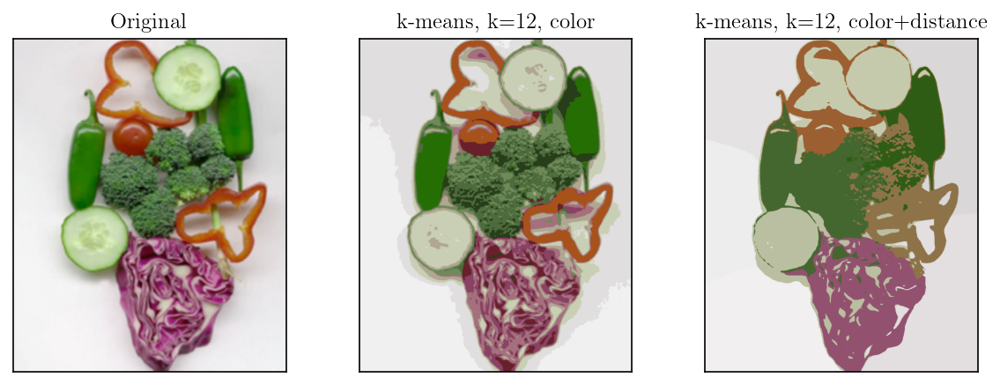

In [1899]:
img1=cv2.cvtColor(cv2.imread("./img_kmeans_01.jpg", cv2.IMREAD_COLOR),cv2.COLOR_BGR2RGB)

fig1 = plt.figure(figsize=(8,3), dpi= 150, facecolor='w', edgecolor='k')
ax1, ax2, ax3=  fig1.add_subplot(131), fig1.add_subplot(132), fig1.add_subplot(133)


ax1.imshow(img1)#, cmap='gray', vmin=0, vmax=255)
ax1.set_title("Original")
ax1.get_xaxis().set_visible(False)
ax1.get_yaxis().set_visible(False)

# The below code for k-means comes from https://www.thepythoncode.com/article/kmeans-for-image-segmentation-opencv-python

pixel_values = img1.reshape((-1, 3))

# convert to float
pixel_values = np.float32(pixel_values)

# define stopping criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)

# number of clusters (K)
k = 12
_, labels, (centers) = cv2.kmeans(pixel_values, k, None, criteria, 10, cv2.KMEANS_PP_CENTERS)


# convert back to 8 bit values
centers = np.uint8(centers)

# flatten the labels array
labels = labels.flatten()

# convert all pixels to the color of the centroids
segmented_image = centers[labels.flatten()]


# reshape back to the original image dimension
segmented_image = segmented_image.reshape(img1.shape)


ax2.imshow(segmented_image, cmap='gray')
#ax1.plot([y,], [x,], "ro", ms=5)
ax2.get_xaxis().set_visible(False)
ax2.get_yaxis().set_visible(False)
ax2.set_title("k-means, k=12, color")



# 색상 정보와 위치 정보를 동시에 고려한 k-means 수행을 위해 위치정보를 [0, 255] 사이의 값을 갖도록 추가한다.

X, Y = np.meshgrid(np.arange(img1.shape[1]), np.arange(img1.shape[0]))
X=X/X.max()*255
Y=Y/Y.max()*255

pixel_values2 = np.zeros((pixel_values.shape[0], pixel_values.shape[1]+2), np.float32)
pixel_values2[:, :3]=pixel_values
pixel_values2[:,3]=X.flatten()
pixel_values2[:,4]=Y.flatten()

# number of clusters (K)
k = 12
_, labels, (centers) = cv2.kmeans(pixel_values2, k, None, criteria, 10, cv2.KMEANS_PP_CENTERS)

# convert back to 8 bit values
centers = np.uint8(centers)

# flatten the labels array
labels = labels.flatten()

# convert all pixels to the color of the centroids
segmented_image = centers[labels.flatten()]


# reshape back to the original image dimension
segmented_image = segmented_image.reshape(pixel_values2.shape)


ax3.imshow((segmented_image[:, :3]).reshape(img1.shape), cmap='gray')
#ax1.plot([y,], [x,], "ro", ms=5)
ax3.get_xaxis().set_visible(False)
ax3.get_yaxis().set_visible(False)
ax3.set_title("k-means, k=12, color+distance")

fig1.tight_layout()
plt.show()

# 미분기를 활용한 이미지 분할 방법

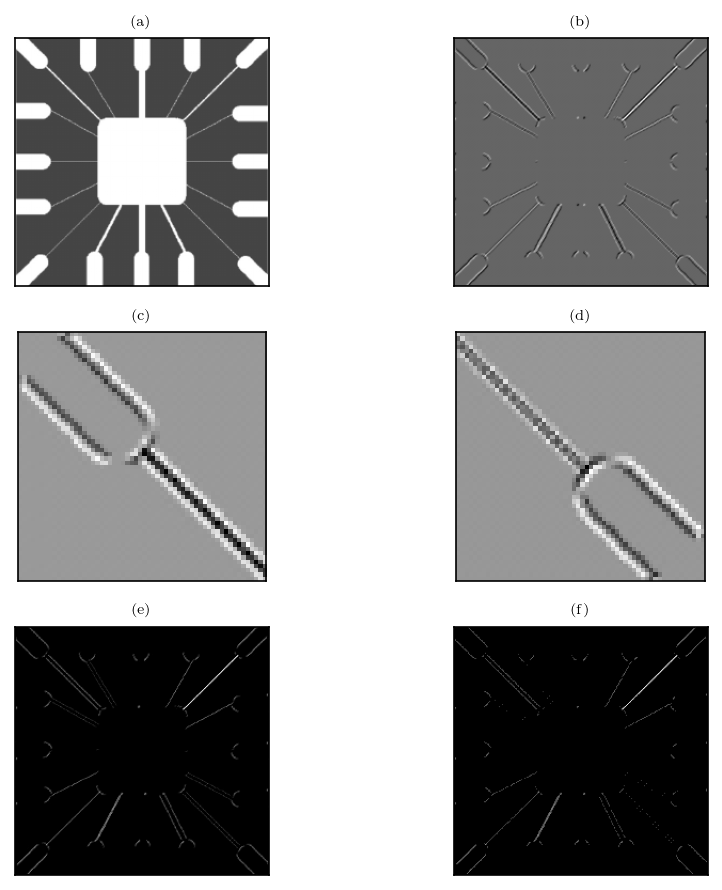

In [1901]:
img1=cv2.cvtColor(cv2.imread("./img_erossion_02.png"), cv2.COLOR_BGR2GRAY)

fig1 = plt.figure(figsize=(6,8), dpi= 150, facecolor='w', edgecolor='k')
ax1, ax2, ax3 = fig1.add_subplot(421), fig1.add_subplot(422), fig1.add_subplot(423)
ax4, ax5, ax6 = fig1.add_subplot(424), fig1.add_subplot(425), fig1.add_subplot(426)

ker1 = np.array([[-1,-1,2],[-1,2,-1], [2,-1,-1]])
ker2 = np.array([[2,-1,-1],[-1,2,-1], [-1,-1,2]])

ax1.imshow(img1, cmap='gray', vmin=0, vmax=255)
ax1.set_title("(a)", size=7)
ax1.get_xaxis().set_visible(False)
ax1.get_yaxis().set_visible(False)

img2 = cv2.filter2D(img1, cv2.CV_64F, ker1)
ax2.imshow(img2, cmap='gray')#, vmin=0, vmax=255)
ax2.set_title("(b)", size=7)
ax2.get_xaxis().set_visible(False)
ax2.get_yaxis().set_visible(False)



N1, N2 = int(img1.shape[0]/4), int(img1.shape[1]/4)

ax3.imshow(img2[:N1, :N1], cmap='gray')
ax3.set_title("(c)", size=7)
ax3.get_xaxis().set_visible(False)
ax3.get_yaxis().set_visible(False)

ax4.imshow(img2[-N1:, -N1:], cmap='gray')
ax4.set_title("(d)", size=7)
ax4.get_xaxis().set_visible(False)
ax4.get_yaxis().set_visible(False)

img5=np.array(img2, copy=True)
img5[img2<0.0]=0.0
img5 = (img5/img5.max()*255).astype(np.uint8)


ax5.imshow(img5, cmap='gray')
ax5.set_title("(e)", size=7)
ax5.get_xaxis().set_visible(False)
ax5.get_yaxis().set_visible(False)

th = 50
img6=np.array(img5, copy=True)
img6[img5<th]=0

ax6.imshow(img6, cmap='gray')
ax6.set_title("(f)", size=7)
ax6.get_xaxis().set_visible(False)
ax6.get_yaxis().set_visible(False)

fig1.tight_layout()
plt.show()

1계 미분기 필터를 이용하여 원본 이미지로부터 특정 방향의 직선 성분만 추출 한 사례. (a) 원본 이미지, (b) $45^\circ$ 기울어진 방향에 대한 필터링 결과, (c, d) (a) 결과의 좌상 및 우하 부분만 확대한 이미지, (e) (b)의 이미지에서 음의 픽셀 값을 모두 0으로 설정한 결과, (f) 미리 설정된 문턱 값을 활용하여 (e) 이미지를 이진화시킨 결과


In [1588]:
def myfilter(img, ker):
    size = ker.shape
    edge = ((size[0]-1)>>1, (size[1]-1)>>1)
    pkind = np.where(ker>0)
    
    imt = np.zeros((img.shape[0]+2*edge[0], img.shape[1]+2*edge[1], pkind[0].shape[0]))
    

    for ind, pp in enumerate(zip(pkind[0], pkind[1])):
        p0, p1 = pp
        x1, x2 = 2*edge[0]-p0, 2*edge[0]-p0+img.shape[0]
        y1, y2 = 2*edge[1]-p1, 2*edge[1]-p1+img.shape[1]
        imt[(2*edge[0]-p0):(2*edge[0]-p0+img.shape[0]),(2*edge[1]-p1):(2*edge[1]-p1+img.shape[1]),ind] \
                    = img[:,:]*ker[p0, p1]
    
    
    return (imt[edge[0]:-edge[0],edge[1]:-edge[1],:]).sum(axis=2)


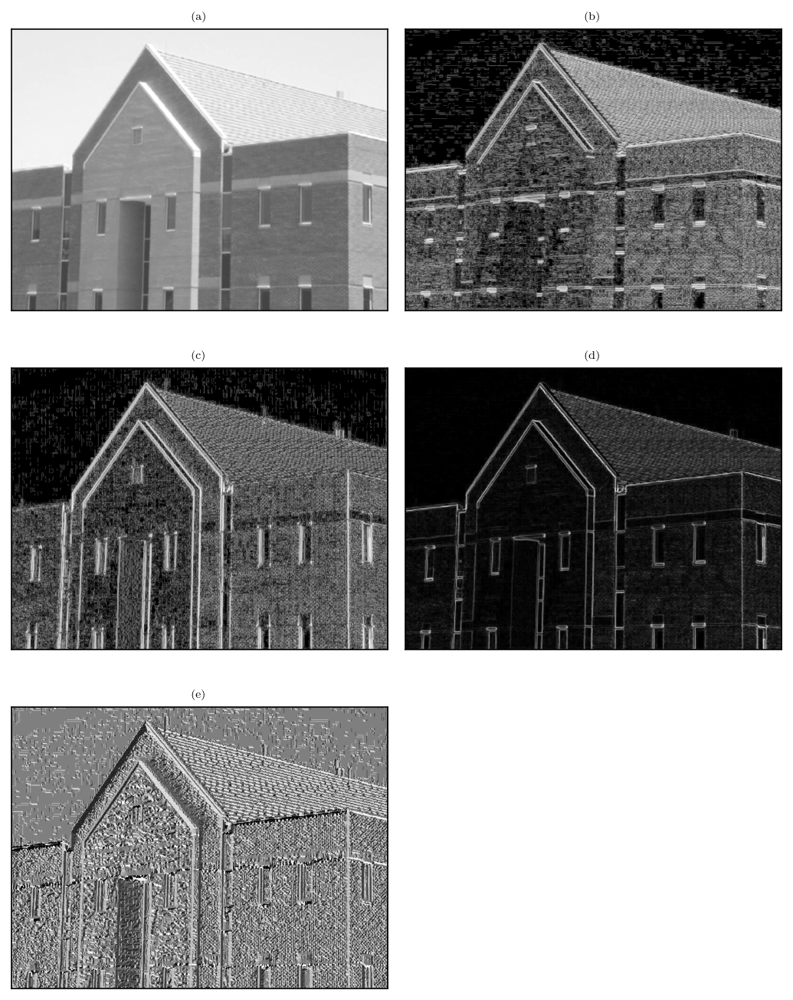

In [1902]:
img1=cv2.cvtColor(cv2.imread("./img_building_01.jpg"), cv2.COLOR_BGR2GRAY)

fig1 = plt.figure(figsize=(7,12), dpi= 150, facecolor='w', edgecolor='k')
ax1, ax2, ax3 = fig1.add_subplot(421), fig1.add_subplot(422), fig1.add_subplot(423)
ax4, ax5 = fig1.add_subplot(424), fig1.add_subplot(425)



ax1.imshow(img1, cmap='gray', vmin=0, vmax=255)
ax1.set_title("(a)", size=7)
ax1.get_xaxis().set_visible(False)
ax1.get_yaxis().set_visible(False)


img_sobelx0 = cv2.Sobel(img1, cv2.CV_64F, 0, 1, ksize=3)
img_sobelx = cv2.convertScaleAbs(img_sobelx0)
ax2.imshow(np.log(1.0 + img_sobelx), cmap='gray')#, vmin=0, vmax=255)
ax2.set_title("(b)", size=7)
ax2.get_xaxis().set_visible(False)
ax2.get_yaxis().set_visible(False)

img_sobely0 = cv2.Sobel(img1, cv2.CV_64F, 1, 0, ksize=3)
img_sobely = cv2.convertScaleAbs(img_sobely0)
ax3.imshow(np.log(1.+img_sobely), cmap='gray')
ax3.set_title("(c)", size=7)
ax3.get_xaxis().set_visible(False)
ax3.get_yaxis().set_visible(False)

ax4.imshow(img_sobelx+img_sobely, cmap='gray')
ax4.set_title("(d)", size=7)
ax4.get_xaxis().set_visible(False)
ax4.get_yaxis().set_visible(False)

img5=np.arctan2(img_sobely0.astype(np.float64), img_sobelx0.astype(np.float64))
#img5[img2<0.0]=0.0
#img5 = (img5/img5.max()*255).astype(np.uint8)


ax5.imshow(img5, cmap='gray')
ax5.set_title("(e)", size=7)
ax5.get_xaxis().set_visible(False)
ax5.get_yaxis().set_visible(False)

fig1.tight_layout()
plt.show()

(a) Original image, (b) $\log (1+|\text{sobel}_x|)$, (c) $\log (1+|\text{sobel}_y|)$, (d) $|\text{sobel}_x| +|\text{sobel}_y|$, (e) $\arctan \left( \dfrac{\text{sobel}_y} {\text{sobel}_x} \right)$

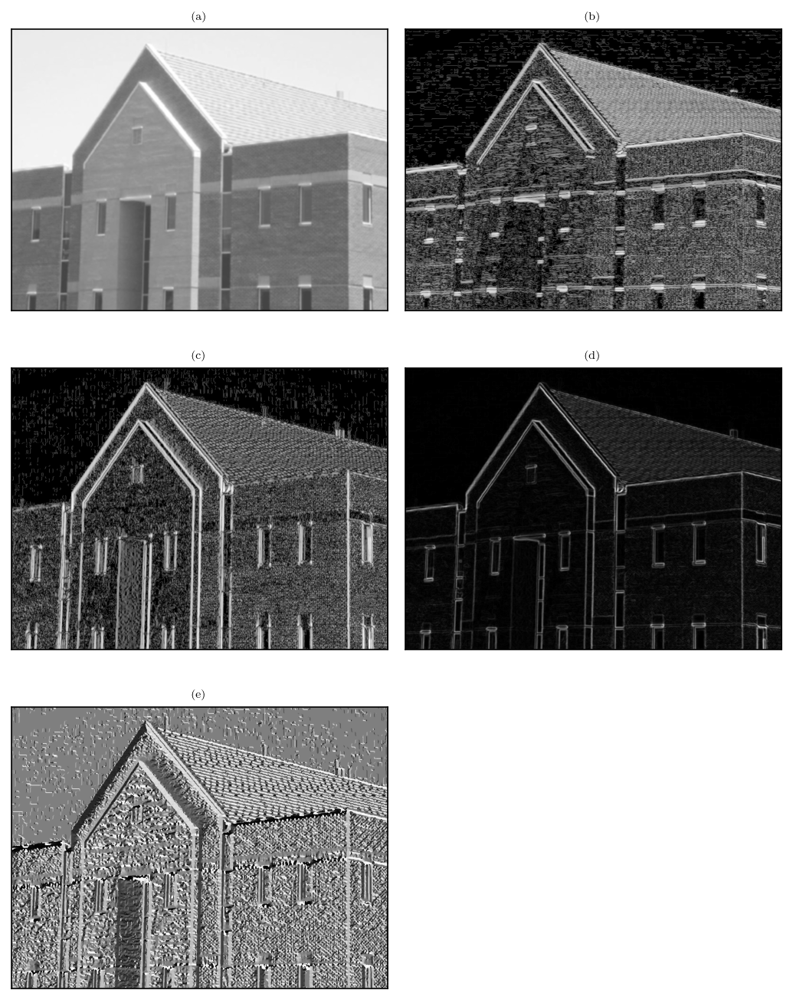

In [1903]:
img1=cv2.cvtColor(cv2.imread("./img_building_01.jpg"), cv2.COLOR_BGR2GRAY)

fig1 = plt.figure(figsize=(7,12), dpi= 150, facecolor='w', edgecolor='k')
ax1, ax2, ax3 = fig1.add_subplot(421), fig1.add_subplot(422), fig1.add_subplot(423)
ax4, ax5 = fig1.add_subplot(424), fig1.add_subplot(425)


# original image smoothed using a 5 × 5 averaging kernel prior to edge detection.
img1m = cv2.blur(img1,(5,5))


ax1.imshow(img1m, cmap='gray', vmin=0, vmax=255)
ax1.set_title("(a)", size=7)
ax1.get_xaxis().set_visible(False)
ax1.get_yaxis().set_visible(False)


img_sobelx0 = cv2.Sobel(img1m, cv2.CV_64F, 0, 1, ksize=3)
img_sobelx = cv2.convertScaleAbs(img_sobelx0)
ax2.imshow(np.log(1.0 + img_sobelx), cmap='gray')#, vmin=0, vmax=255)
ax2.set_title("(b)", size=7)
ax2.get_xaxis().set_visible(False)
ax2.get_yaxis().set_visible(False)

img_sobely0 = cv2.Sobel(img1m, cv2.CV_64F, 1, 0, ksize=3)
img_sobely = cv2.convertScaleAbs(img_sobely0)
ax3.imshow(np.log(1.+img_sobely), cmap='gray')
ax3.set_title("(c)", size=7)
ax3.get_xaxis().set_visible(False)
ax3.get_yaxis().set_visible(False)

ax4.imshow(img_sobelx+img_sobely, cmap='gray')
ax4.set_title("(d)", size=7)
ax4.get_xaxis().set_visible(False)
ax4.get_yaxis().set_visible(False)

img5=np.arctan2(img_sobely0.astype(np.float64), img_sobelx0.astype(np.float64))


ax5.imshow(img5, cmap='gray')
ax5.set_title("(e)", size=7)
ax5.get_xaxis().set_visible(False)
ax5.get_yaxis().set_visible(False)
fig1.tight_layout()
plt.show()

(a) Smoothed image of original by $5\times 5$ averaging kernel, (b) $\log (1+|\text{sobel}_x|)$, (c) $\log (1+|\text{sobel}_y|)$, (d) $|\text{sobel}_x| +|\text{sobel}_y|$, (e) $\arctan \left( \dfrac{\text{sobel}_y} {\text{sobel}_x} \right)$


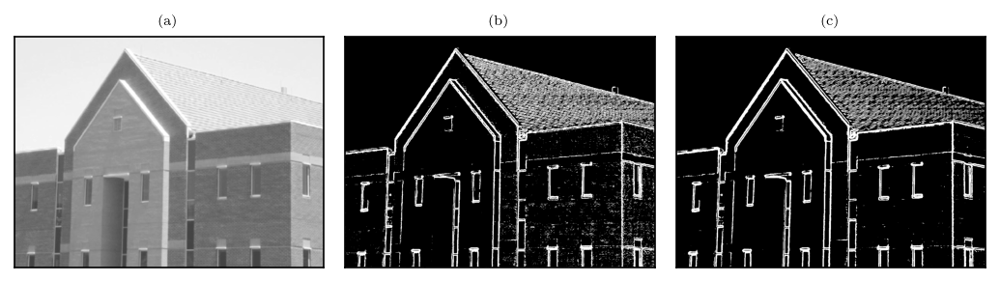

In [1904]:
img1=cv2.cvtColor(cv2.imread("./img_building_01.jpg"), cv2.COLOR_BGR2GRAY)

fig1 = plt.figure(figsize=(7,5), dpi= 150, facecolor='w', edgecolor='k')
ax1, ax2, ax3 = fig1.add_subplot(131), fig1.add_subplot(132), fig1.add_subplot(133)

ax1.imshow(img1, cmap='gray', vmin=0, vmax=255)
ax1.set_title("(a)", size=7)



img_sobelx0 = cv2.Sobel(img1, cv2.CV_64F, 0, 1, ksize=3)
img_sobelx = cv2.convertScaleAbs(img_sobelx0)

img_sobely0 = cv2.Sobel(img1, cv2.CV_64F, 1, 0, ksize=3)
img_sobely = cv2.convertScaleAbs(img_sobely0)

img_b1=img_sobelx+img_sobely

img_b1 = (img_b1-img_b1.min())/(img_b1.max()-img_b1.min())*255
img_b1 = img_b1.astype(np.uint8)

th, img_c1 = cv2.threshold(img_b1, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

ax2.imshow(img_c1, cmap="gray")
ax2.set_title("(b)", size=7)
img1m = cv2.blur(img1,(5,5))

img_sobelx0 = cv2.Sobel(img1m, cv2.CV_64F, 0, 1, ksize=3)
img_sobelx = cv2.convertScaleAbs(img_sobelx0)

img_sobely0 = cv2.Sobel(img1m, cv2.CV_64F, 1, 0, ksize=3)
img_sobely = cv2.convertScaleAbs(img_sobely0)

img_b2=img_sobelx+img_sobely

img_b2 = (img_b2-img_b2.min())/(img_b2.max()-img_b2.min())*255
img_b2 = img_b2.astype(np.uint8)

th, img_c2 = cv2.threshold(img_b2, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

ax3.imshow(img_c2, cmap="gray")
ax3.set_title("(c)", size=7)



for ax in fig1.get_axes():
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

fig1.tight_layout()
plt.show()

(a) Original, (b) 원본 이미지의 $|\text{sobel}_x| +|\text{sobel}_y|$ 에 대한 Otsu thresholding 결과, (c) $5\times 5$ 평균값 필터링된 이미지의 $|\text{sobel}_x| +|\text{sobel}_y|$ 에 대한 Otsu thresholding 결과.

- 강의록에서는 (b), (c) 이미지가 차이가 현저하지만 여기서는 큰 차이를 보이지 않는다. (c)-(b) 해서 plot 해보면 좀 차이는 있다. 어떤 thresholding 을 사용했는지에 따라 다를 수도 있고, 내가 사용한 이미지는 강의록 pdf 파일에서 따온 것이기 때문에 사용한 이미지 퀄리티 문제일 수도 있다. 

In [1813]:
def marr_hilderth(img, kernelsize=5, gsigma=1.):
    
    # Laplacian kernel
    mask = np.array([[0,1,0],[1,-4,1],[0,1,0]])
    
    gaussian = cv2.GaussianBlur(img.astype(np.float64), (kernelsize, kernelsize),  gsigma) 
    print(np.unique(gaussian))
    LoG = cv2.filter2D(gaussian, cv2.CV_64F, mask)
    
    return LoG



def calc_zero_crossing(logimg, kernsize, th=0.0):
    edge = (kernsize-1)>>1
    img_zc = np.zeros_like(logimg)
    logimg = logimg-th
    for i in range(edge, logimg.shape[0]-(kernsize-1)):
        for j in range(edge, logimg.shape[1]-(kernsize-1)):
            if logimg[i][j] == 0:
                if (logimg[i][j-1] < 0 and logimg[i][j+1] > 0):
                    img_zc[i][j] = 255
                elif (logimg[i][j-1] < 0 and logimg[i][j+1] > 0):
                    img_zc[i][j] = 255
                elif (logimg[i][j-1] < 0 and logimg[i][j+1] < 0):
                    img_zc[i][j] = 255
                elif (logimg[i-1][j] < 0 and logimg[i+1][j] > 0): 
                    img_zc[i][j] = 255
                elif (logimg[i-1][j] > 0 and logimg[i+1][j] < 0):
                    img_zc[i][j] = 255
            if logimg[i][j] < 0:
                if (logimg[i][j-1] > 0) or (logimg[i][j+1] > 0): 
                    img_zc[i][j] = 255
                if (logimg[i-1][j] > 0) or (logimg[i+1][j] > 0):
                    img_zc[i][j] = 255
    return img_zc


[ 67.8631114   67.86894388  67.87122705 ... 252.52058959 252.53325457
 252.54541414]


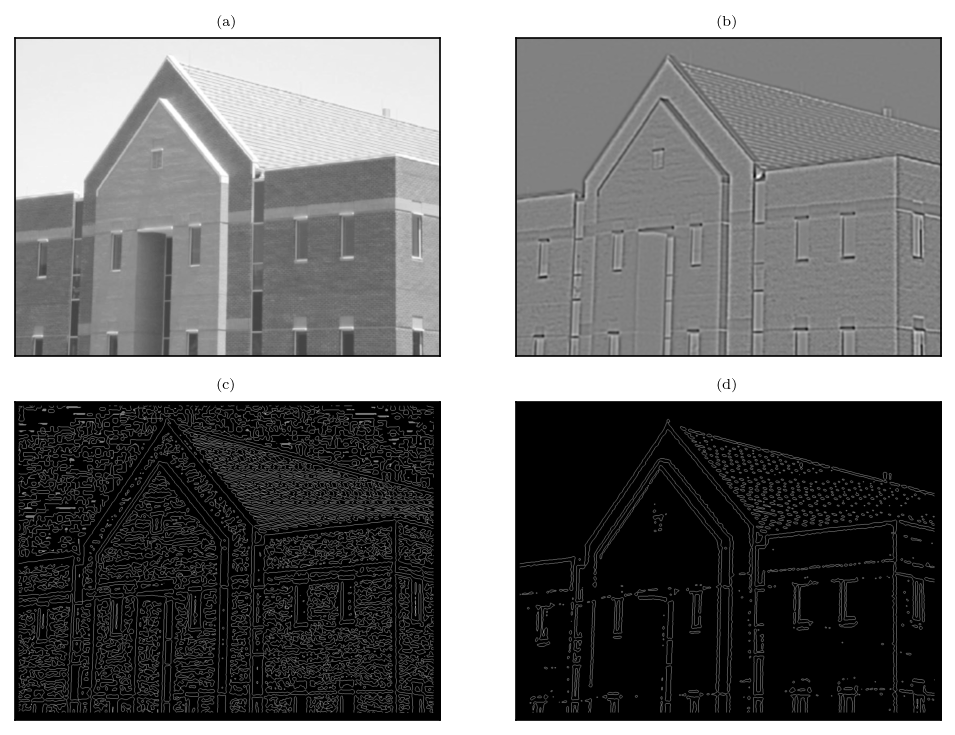

In [1905]:
img1=cv2.cvtColor(cv2.imread("./img_building_01.jpg"), cv2.COLOR_BGR2GRAY)

fig1 = plt.figure(figsize=(7,5), dpi= 150, facecolor='w', edgecolor='k')
ax1, ax2, ax3, ax4 = fig1.add_subplot(221), fig1.add_subplot(222), fig1.add_subplot(223),\
                     fig1.add_subplot(224), 

ax1.imshow(img1, cmap='gray', vmin=0, vmax=255)
ax1.set_title("(a)", size=7)


LoG = marr_hilderth(img1, 25, 4)

ax2.imshow(LoG, cmap="gray")
ax2.set_title("(b)", size=7)

#img2=np.array(LoG, copy=True)
#img2[LoG<0]=0
img2 = calc_zero_crossing(LoG, 25)
ax3.imshow(img2, cmap='gray')
ax3.set_title("(c)", size=7)


img3 = calc_zero_crossing(LoG, 25, LoG.max()*0.10)
ax4.imshow(img3, cmap="gray")
ax4.set_title("(d)", size=7)



for ax in fig1.get_axes():
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

fig1.tight_layout()
plt.show()


(a) Original image, (b) $\sigma = 4.0$ 와 $25 \times 25$ 의 가우시안 블러링과 $3\times 3$ 라플라시안 필터를 사용하여 Marr-Hildreth 방법으로 추출한 경계 이미지. (c) Zero crossings of (b) using a threshold of 0 (d) Zero crossings found using a threshold equal to 10% of the maximum value of the image in (b). 원문에는 4 % maximum of (b) 를 사용했지만 나의 경우는 10% 를 사용했다. 

[ 67.33525129  67.33556502  67.3401175  ... 250.90513578 250.92688829
 250.93648191]
15 60


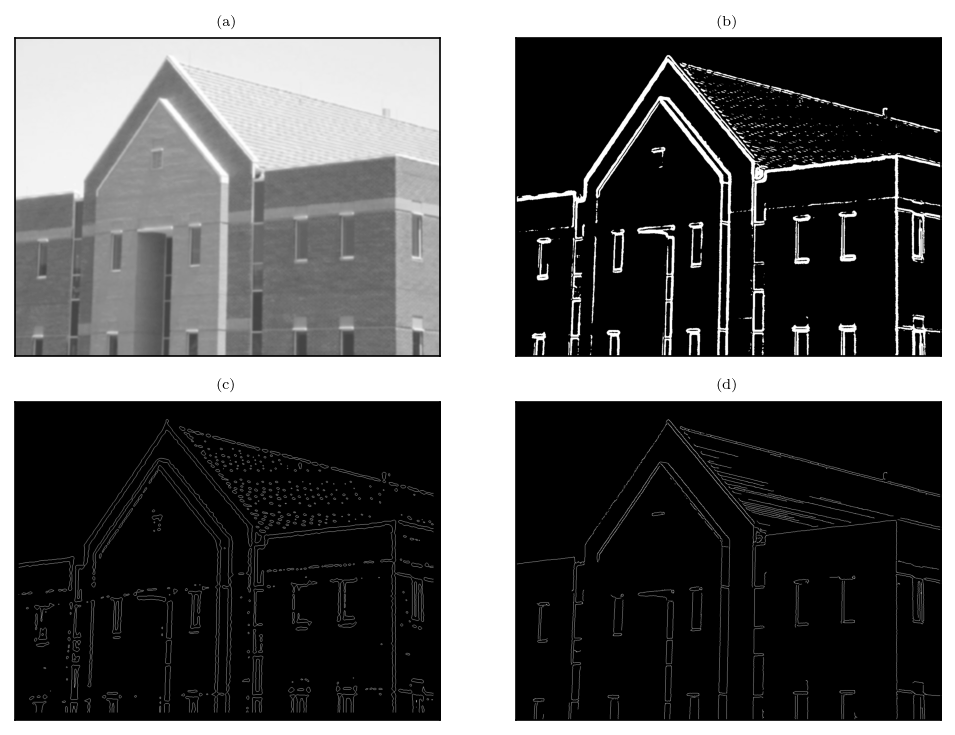

In [1906]:
img0=cv2.cvtColor(cv2.imread("./img_building_01.jpg"), cv2.COLOR_BGR2GRAY)
img1= cv2.GaussianBlur(img0.astype(np.float64), (7, 7),  4.) 
img1=img1.astype(np.uint8)
fig1 = plt.figure(figsize=(7,5), dpi= 150, facecolor='w', edgecolor='k')
ax1, ax2, ax3, ax4 = fig1.add_subplot(221), fig1.add_subplot(222), fig1.add_subplot(223),\
                     fig1.add_subplot(224), 

ax1.imshow(img1, cmap='gray', vmin=0, vmax=255)
ax1.set_title("(a)", size=7)


img1m = cv2.blur(img1,(5,5))

img_sobelx0 = cv2.Sobel(img1m, cv2.CV_64F, 0, 1, ksize=3)
img_sobelx = cv2.convertScaleAbs(img_sobelx0)

img_sobely0 = cv2.Sobel(img1m, cv2.CV_64F, 1, 0, ksize=3)
img_sobely = cv2.convertScaleAbs(img_sobely0)

img_b2=img_sobelx+img_sobely

img_b2 = (img_b2-img_b2.min())/(img_b2.max()-img_b2.min())*255
img_b2 = img_b2.astype(np.uint8)

th, img_c2 = cv2.threshold(img_b2, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

ax2.imshow(img_c2, cmap="gray")
ax2.set_title("(b)", size=7)




LoG = marr_hilderth(img1, 25, 4)
img2 = calc_zero_crossing(LoG, 25)
img3 = calc_zero_crossing(LoG, 25, LoG.max()*0.1)
ax3.imshow(img3, cmap='gray')
ax3.set_title("(c)", size=7)


th1, th2= 15, 60
print(th1, th2)
img3 = cv2.Canny(img1, th1, th2, edges=None, apertureSize=None, L2gradient=False)

ax4.imshow(img3, cmap="gray")
ax4.set_title("(d)", size=7)



for ax in fig1.get_axes():
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)

fig1.tight_layout()
plt.show()


발표자료에서 추출한 이미지로는 강의자료와 비슷한 이미지가 안나오는데, 추출한 이미지에 gaussian blur 를 약간 가하면 그나마 비슷한 이미지가 나온다.
(a) Gaussian blured Original image (b) Thresholded gradient of the smoothed image. (c) Image obtained using the Marr-Hildreth algorithm. (d) Image obtained using the Canny algorithm. Note the significant improvement of the Canny image compared to the other two.
   